# Правила оформления

Здесь (или в сгенерированном вами html / pdf / ...) должны находиться картинки и слова к ним. Картинки должны содержать всевозможную интересную информацию, которые вы достали из данных с помощью методов визуализации. Слова должны являть собой ваши размышления об увиденном на картинке и вообще обо всем, что вы об этом думаете. Чем полезнее в совокупности будет представленная здесь информация и аккуратнее ваша работа, тем больше баллов вы за это получите.

- вы можете в качестве research-хранилища прикрепить ноутбук / html / pdf / ... - что угодно, главное, чтобы все картинки и 
    слова были видны. Если какие-то или все картинки не видны, их нужно прикрепить в классрум и указать название картинки,
    о которой идет речь в ваших рассуждениях
- чтобы картинки были видны, можно:
    - рисовать их в matplotlib / seaborn (изучаете в plotly / bokeh, достаете точки и рисуете, напр. seaborn'ом)
    - делать скрины
    - сохранять картинки через plotly-API (кнопка справа вверху на графике сохраняет картинку в том виде, в котором она сейчас 
        есть - с зумом, поворотом и тп)
    - plotly: `fig.show(renderer='png')` [нужно поставить kaleido: `!pip install kaleido==0.1.0post1`]
    - кидать картинки "в интернет" (напр. в гугл диск) и вставлять через ссылки
    - что угодно еще, лишь бы их было видно или они были скинуты в классрум
- чтобы проверить, видны ли картинки в колабе, можно просто сохранить ваш ноутбук и загрузить в колаб
    (bokeh вроде видно, но я не уверен, что он не исчезнет со временем - кидайте картинки на всякий случай или рисуйте в mpl / seaborn)
- скидывать картинки нужно все в отдельном архиве
    
- картинка "засчитывается" (за нее ставятся баллы), только если рядом с ней находятся какие-то слова, поясняющие, что вы на ней 
    видите и на какие мысли это вас наталкивает (+ сама картинка видна или скинута, если скинута, то указано ее название)
    
- распределения оригинальных признаков кидать не нужно!


<br>

Блок ниже дан, чтобы вы проверили, какие варианты видны в колабе, какие - нет. Его можно удалить, когда вам все станет ясно.

## Что как рендерится

Попробуйте запустить этот блок, а потом сохраните ноутбук и загрузите его в https://colab.research.google.com,
        чтобы посмотреть, что к чему. Также советую посмотреть семинар 13.12, чтобы услышать какие-то дополнительные слова по 
        этому поводу.

In [1]:
import pandas as pd, numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler,PowerTransformer, FunctionTransformer

tr = pd.read_csv('train.csv')
tst = pd.read_csv('test.csv').assign(smoking=-1)

tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  10000 non-null  int64  
 1   height_cm            10000 non-null  int64  
 2   weight_kg            10000 non-null  int64  
 3   waist_cm             10000 non-null  float64
 4   eyesight_left        10000 non-null  float64
 5   eyesight_right       10000 non-null  float64
 6   hearing_left         10000 non-null  int64  
 7   hearing_right        10000 non-null  int64  
 8   systolic             10000 non-null  int64  
 9   relaxation           10000 non-null  int64  
 10  fasting_blood_sugar  10000 non-null  int64  
 11  cholesterol          10000 non-null  int64  
 12  triglyceride         10000 non-null  int64  
 13  hdl                  10000 non-null  int64  
 14  ldl                  10000 non-null  int64  
 15  hemoglobin           10000 non-null  

In [2]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer



tr['new_log_gtp'] = np.log1p(tr.gtp)
tst['new_log_gtp'] = np.log1p(tst.gtp)
cols = ['alt']
transform = PowerTransformer('box-cox')
for col in cols:
    tr["power_"+col] = transform.fit_transform(tr[[col]])
    tst["power_"+col] = transform.fit_transform(tst[[col]])

cols = ['ast',  'triglyceride', 'hdl']

for col in cols:
    tr["log_"+col] = np.log1p(tr[col])
    tst["log_"+col] = np.log1p(tst[col])

tr['hearing'] = tr['hearing_left'] + tr['hearing_right'] - 2
tst['hearing'] = tst['hearing_left'] + tst['hearing_right'] - 2
tr['blood_pressure_category'] = pd.cut(tr['systolic'], bins=[0, 120, 140, np.inf], labels=[0, 1, 2])
tst['blood_pressure_category'] = pd.cut(tst['systolic'], bins=[0, 120, 140, np.inf], labels=[0, 1, 2])

In [3]:


my_favorite_cols = ['age', 'height_cm', 'hemoglobin', 'weight_kg', 'new_log_gtp']

import plotly.express as px

fig = px.scatter_3d(tr, x='age', y='hemoglobin', z='new_log_gtp', color='smoking')
_ = fig.update_traces(marker_size=2.5)


fig.show() # (не работает)

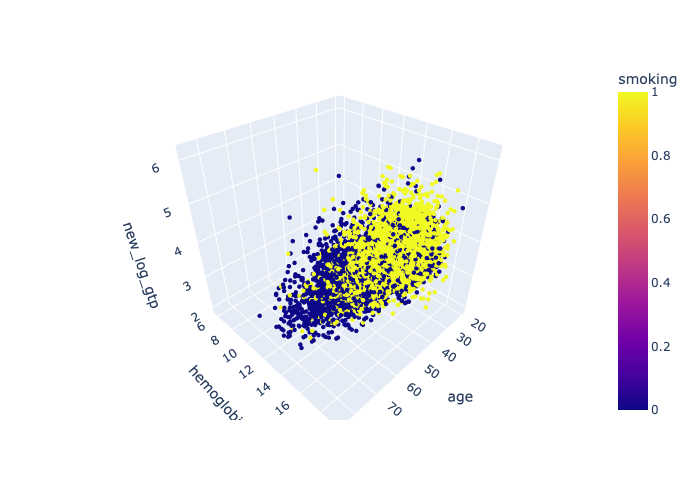

In [4]:
fig.show(renderer='png') # (работает)

**`html-вставка картинки с компьютера`** (не работает)

<img src='img/newplot.png'>

**`html-вставка картинки по ссылке из интернета`** (работает)

<img src='https://images.datacamp.com/image/upload/v1679396621/Plotly_Express_242e999c38.gif'>

In [5]:
plot_cols = np.r_[my_favorite_cols, ['smoking']]
plot_data_tr = tr[plot_cols].copy()
plot_data_tst = tst[plot_cols].sample(1_000, random_state=911)

# СКЕЙЛИНГ
means = plot_data_tr[my_favorite_cols].mean(axis=0)
stds = plot_data_tr[my_favorite_cols].std(axis=0)

plot_data_tr.loc[:, my_favorite_cols] = (plot_data_tr.loc[:, my_favorite_cols] - means) / stds
plot_data_tst.loc[:, my_favorite_cols] = (plot_data_tst.loc[:, my_favorite_cols] - means) / stds

plot_data_scaled = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

**`bokeh`** (вроде работает) и **`plotly через ipywidgets`** (не работает)

In [38]:
from utils.reductors import *
from utils.utils import plot_dim_reduction
from collections import namedtuple


hue_info = namedtuple('hue_info', ['field_name', 'is_categorical'])


def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        'UMAP 2D n_neighbors=17': {
            'params': {
               'n_neighbors': 17,
               'min_dist': 0.1,
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'PCA 3D': {
            'params': {
               'n_components': 3
            },
            'func': make_pca,
        },
        'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {
            'params': {
                'n_jobs': 1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'dof': 0.5,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

results = plot_standard_embeddings(plot_data_scaled, my_favorite_cols, return_results=True)

Loading BokehJS ...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:41<00:00, 14.00s/it]


    'data': [{'hovertemplate': 'smoking=1<br>x=%{x}<br>y=%{y}<br>z=%{z}<extra></…

In [44]:
%%time
tsne_mapper_embedding = results['tsne 2D perplexity=60 exaggeration=4 dof=0.5']['embedding']

# Не делайте так, если у вас хватает памяти сделать копию!
tst.loc[:, my_favorite_cols] = (tst.loc[:, my_favorite_cols] - means) / stds

tsne_test_embedding = tsne_mapper_embedding.transform(tst[my_favorite_cols], perplexity=60)

CPU times: user 2min 11s, sys: 2.82 s, total: 2min 14s
Wall time: 2min 17s


In [45]:
%%time
import fast_hdbscan # немного долго импортируется в первый раз

hdbscan = fast_hdbscan.HDBSCAN(min_samples=10, min_cluster_size=50)
clusters = hdbscan.fit_predict(tsne_test_embedding)
clusters_for_train = hdbscan.fit_predict(tsne_mapper_embedding)[:tr.shape[0]]

CPU times: user 10.6 s, sys: 282 ms, total: 10.9 s
Wall time: 1.68 s


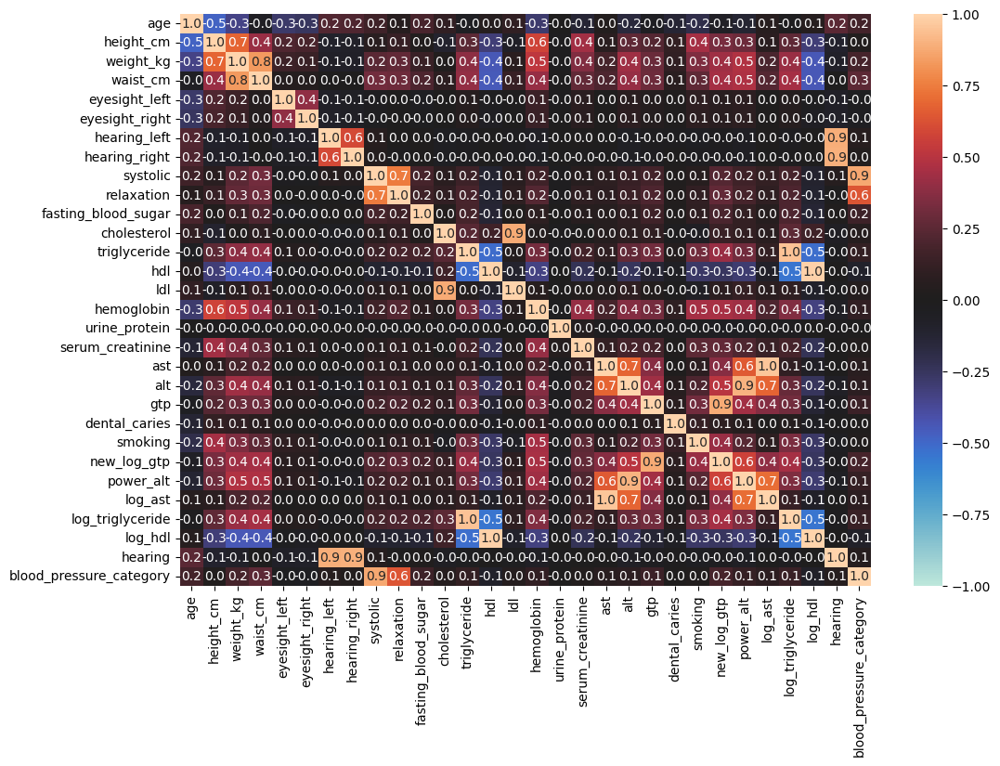

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(12, 8))
sns.heatmap(tr.corr(), 
            annot = True, 
            fmt='.1f', 
            vmin=-1, 
            vmax=1, 
            center=0)
plt.show()

In [46]:
%%time
import fast_hdbscan # немного долго импортируется в первый раз

hdbscan = fast_hdbscan.HDBSCAN(min_samples=10, min_cluster_size=50)
clusters = hdbscan.fit_predict(tsne_test_embedding)
clusters_for_train = hdbscan.fit_predict(tsne_mapper_embedding)[:tr.shape[0]]

CPU times: user 11 s, sys: 235 ms, total: 11.2 s
Wall time: 1.82 s


Данная хитмапа очень поможет при поотроеении линейной моодели, так как нам не хочется одновременноо брать
высоко коррелирующие признаки, а также признаки, которые слабо влияют на курение.

выберем колонки с высокой корреляцией 

Построим линейную модель и knn для признаков с высокой корреляцией с курением.

In [47]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score
from sklearn.model_selection import cross_val_score
tr_new = tr[my_favorite_cols]
tst_new = tst[my_favorite_cols]



X = tr_new
y = tr.smoking
clf = LogisticRegression(C = 1, max_iter = 1000)
scores = cross_val_score(clf, X, y, cv=5, scoring = 'f1_macro')




In [48]:
scores.mean()

0.7295513373863061

In [49]:
clf.fit(X, y)

LogisticRegression(C=1, max_iter=1000)

In [50]:
y_pred = clf.predict(tst_new)

In [51]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': y_pred})
res

,id,smoking
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0
...,...,...
149251,149251,0
149252,149252,0
149253,149253,0
149254,149254,0


In [52]:
res.to_csv('log_reg.csv', index=False)

Заметим, что у простой линейной модели скор лучше, чем у наивной реализации, так что попробуем прикрутить log reg для второго, плохо классифицируемого кластера.

Попробовали добавить метку попадания в кластер как признак - получили улучшение качества модели на 0.2, так как по сути это хороший критерия.

Попробуем добавить некоторые признаки, которые на мой взгляд будут более лучшими, чем текущие, к таким отнесем hearing right и left. Сделаем из него 1 признак, отвечающий за общий уровень слышимости человека, сложив два этих признака. Также заметим по распределению blood pressure, что в них выделяются 3 категории людей с различными типами кровенного давления, так что сделаем колонку с этим типом. 

Также попробуем следующие, нижеприведенные трансформации над данными, чтобы посмотреть получилось ли что-то лучшее,
чем есть сейчас

In [53]:
cols = ['alt']
transform = PowerTransformer('box-cox')
for col in cols:
    tr["power_"+col] = transform.fit_transform(tr[[col]])
    tst["power_"+col] = transform.fit_transform(tst[[col]])

cols = ['triglyceride', 'hdl']

for col in cols:
    tr["log_"+col] = np.log1p(tr[col])
    tst["log_"+col] = np.log1p(tst[col])

<AxesSubplot: xlabel='log_hdl', ylabel='Count'>

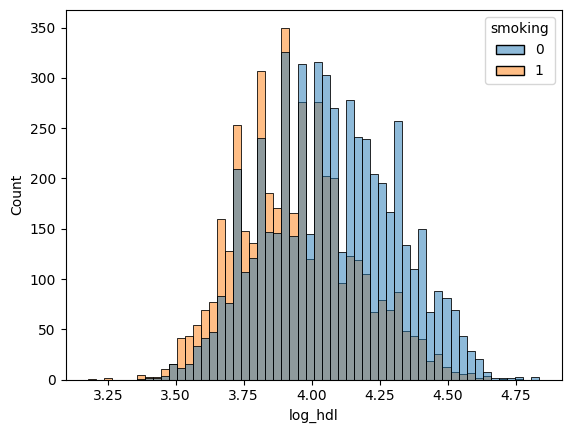

In [54]:
import seaborn as sns
sns.histplot(data = tr, x = 'log_hdl', hue = 'smoking')

<AxesSubplot: xlabel='hdl', ylabel='Count'>

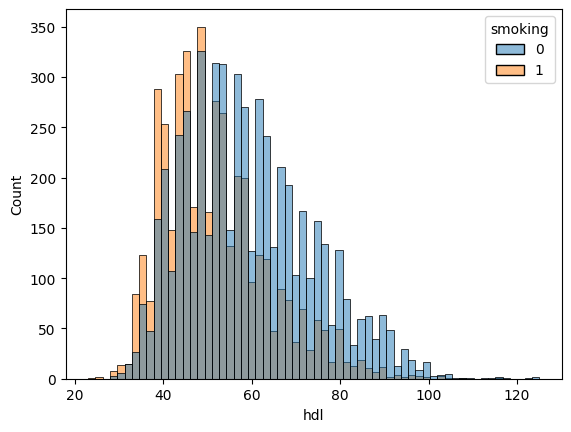

In [55]:
sns.histplot(data = tr, x = 'hdl', hue = 'smoking')

<AxesSubplot: xlabel='triglyceride', ylabel='Count'>

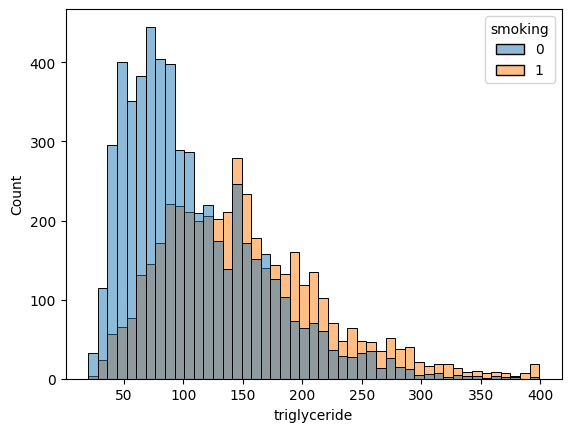

In [56]:
sns.histplot(data = tr, x = 'triglyceride', hue = 'smoking')

<AxesSubplot: xlabel='log_triglyceride', ylabel='Count'>

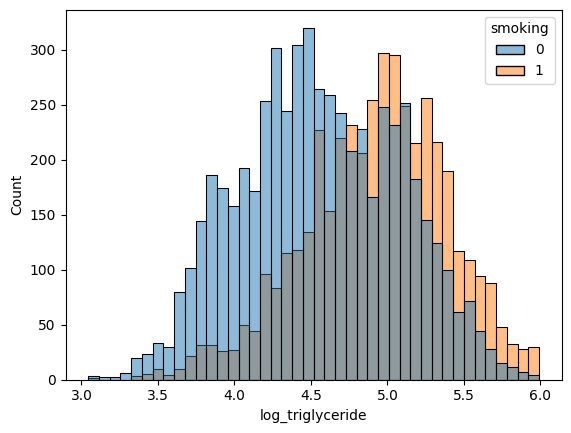

In [57]:
sns.histplot(data = tr, x = 'log_triglyceride', hue = 'smoking')

Оба распределения поле трансформации мне нравятся больше, так как тут распределния не смещенные, а нормальные

<AxesSubplot: xlabel='power_alt', ylabel='Count'>

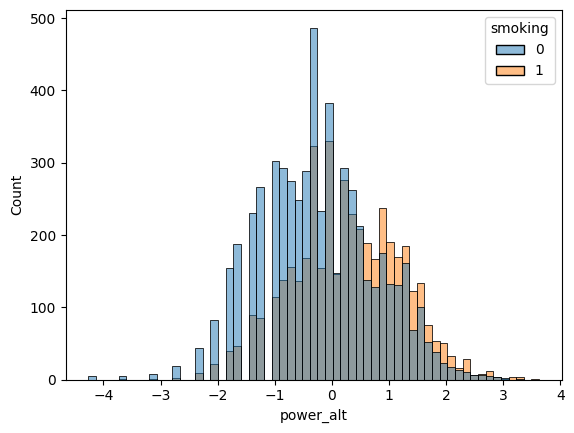

In [58]:
sns.histplot(data = tr, x = 'power_alt', hue = 'smoking')

<AxesSubplot: xlabel='alt', ylabel='Count'>

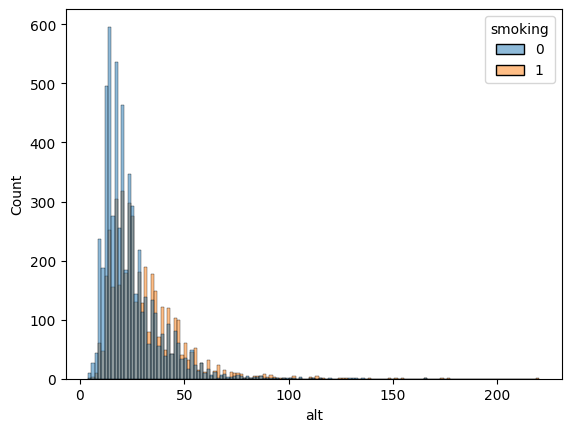

In [59]:
sns.histplot(data = tr, x = 'alt', hue = 'smoking')

аналогично распределение alt после преобразоания бокса кокса по-моему мнению лучше, так как оно не такое островершинное, а также больше похоже на нормальное. 

Также, я пробовал применять преобразование x/(x + 1) к разным данным, но оно мне не особо понравилось, ниже
приведены графики:

<AxesSubplot: xlabel='alt_custome', ylabel='Count'>

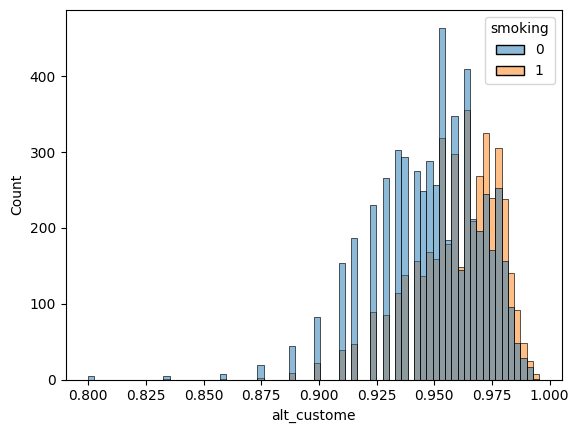

In [60]:
from sklearn.preprocessing import FunctionTransformer
transformer = FunctionTransformer(lambda x: x/(x + 1))
tr['alt_custome'] = transformer.transform(tr['alt'])
sns.histplot(data = tr, x = 'alt_custome', hue = 'smoking')

Мне это распределение понравилось меньше, так как оно не неприрывноее и не симметричное, с провалом в центре.

# Теперь же попробуем поработать с тем кластером, что у нас получился раньше

Начнем наше исселедование с помощью изменения гиперпараметров улучшить разбиенение кластеров, однако тисни никак не улучшается

In [61]:
results = plot_standard_embeddings(plot_data_scaled, my_favorite_cols, return_results=True)

Loading BokehJS ...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:42<00:00, 14.23s/it]


    'data': [{'hovertemplate': 'smoking=1<br>x=%{x}<br>y=%{y}<br>z=%{z}<extra></…

In [62]:
tst['in_cluster'] = (clusters == 0).astype(int)
tr['in_cluster'] = (clusters_for_train == 0).astype(int)

In [76]:
tr_to_cluster = tr[tr['in_cluster'] == 1]
tst_to_cluster = tst[tst['in_cluster'] == 1]

Для того, чтобы получить новый кластер возьмем другие колонки и посмотроим кластеры на них

In [77]:
my_favorite_cols = ['waist_cm', 'hdl', 'triglyceride', 'serum_creatinine', 'blood_pressure_category']
numerical = ['waist_cm', 'hdl', 'triglyceride', 'serum_creatinine']


import plotly.express as px

fig = px.scatter_3d(tr_to_cluster, x='waist_cm', y='hdl', z='triglyceride', color='smoking')
_ = fig.update_traces(marker_size=2.5)


fig.show() # (работает)

Получилось что-то разделимое, посмотрим что получится после тисни(юмеп по-моему непонятно рисует)

In [78]:
plot_cols = np.r_[my_favorite_cols, ['smoking']]
plot_data_tr = tr_to_cluster[plot_cols].copy()

# СКЕЙЛИНГ
means = plot_data_tr[numerical].mean(axis=0)
stds = plot_data_tr[numerical].std(axis=0)

plot_data_tr.loc[:, numerical] = (plot_data_tr.loc[:, numerical] - means) / stds
plot_data_scaled = plot_data_tr

In [79]:
from utils.reductors import *
from utils.utils import plot_dim_reduction
from collections import namedtuple


hue_info = namedtuple('hue_info', ['field_name', 'is_categorical'])


def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        
        'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {
            'params': {
                'n_jobs': 1,
                'perplexity': 80,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'dof': 0.1,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
        'UMAP 2D n_neighbors=17': {
            'params': {
               'n_neighbors': 17,
               'min_dist': 0.1,
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

results = plot_standard_embeddings(plot_data_scaled, my_favorite_cols, return_results=True)

Loading BokehJS ...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [04:25<00:00, 132.69s/it]


Левый кластер по-моему мнению более синий, чем красный, а правый сильно более красный.

Попробуем другие подмножества признаков. 

In [80]:
my_favorite_cols = ['waist_cm', 'log_hdl', 'log_triglyceride', 'blood_pressure_category', 'serum_creatinine']
numerical = ['waist_cm', 'log_hdl', 'log_triglyceride', 'serum_creatinine']


import plotly.express as px

fig = px.scatter_3d(tr_to_cluster, x='waist_cm', y='log_hdl', z='log_triglyceride', color='smoking')
_ = fig.update_traces(marker_size=2.5)


fig.show() # (работает)

In [81]:
plot_cols = np.r_[my_favorite_cols, ['smoking']]
plot_data_tr = tr_to_cluster[plot_cols].copy()

# СКЕЙЛИНГ
means = plot_data_tr[numerical].mean(axis=0)
stds = plot_data_tr[numerical].std(axis=0)

plot_data_tr.loc[:, numerical] = (plot_data_tr.loc[:, numerical] - means) / stds
plot_data_scaled = plot_data_tr

In [82]:
from utils.reductors import *
from utils.utils import plot_dim_reduction
from collections import namedtuple


hue_info = namedtuple('hue_info', ['field_name', 'is_categorical'])


def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        
        'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {
            'params': {
                'n_jobs': 1,
                'perplexity': 80,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'dof': 0.15,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
        'UMAP 2D n_neighbors=17': {
            'params': {
               'n_neighbors': 17,
               'min_dist': 0.1,
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

results = plot_standard_embeddings(plot_data_scaled, my_favorite_cols, return_results=True)

Loading BokehJS ...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [04:11<00:00, 125.51s/it]


Рисунки получились не очень, попробуем другое подмножество

In [89]:
my_favorite_cols = ['power_alt', 'hdl', 'triglyceride', 'blood_pressure_category', 'serum_creatinine', 'hearing']
numerical = ['hdl', 'triglyceride', 'serum_creatinine']


import plotly.express as px

fig = px.scatter_3d(tr_to_cluster, x='waist_cm', y='log_hdl', z='log_triglyceride', color='smoking')
_ = fig.update_traces(marker_size=2.5)


fig.show() # (работает)

Вроде +- разделимо, можно попробовать

In [90]:
plot_cols = np.r_[my_favorite_cols, ['smoking']]
plot_data_tr = tr_to_cluster[plot_cols].copy()

# СКЕЙЛИНГ
means = plot_data_tr[numerical].mean(axis=0)
stds = plot_data_tr[numerical].std(axis=0)

plot_data_tr.loc[:, numerical] = (plot_data_tr.loc[:, numerical] - means) / stds
plot_data_scaled = plot_data_tr

In [91]:
from utils.reductors import *
from utils.utils import plot_dim_reduction
from collections import namedtuple


hue_info = namedtuple('hue_info', ['field_name', 'is_categorical'])


def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        
        'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {
            'params': {
                'n_jobs': 1,
                'perplexity': 80,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'dof': 0.15,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
        'UMAP 2D n_neighbors=17': {
            'params': {
               'n_neighbors': 17,
               'min_dist': 0.1,
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

results = plot_standard_embeddings(plot_data_scaled, my_favorite_cols, return_results=True)

Loading BokehJS ...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [04:25<00:00, 132.62s/it]


К сожалению, чего-то лучшего, чем первое разделение получить не удалось. 

Посмотрим на интересные графики, позволяющие визуализировать полученные результаты

In [93]:
corners = np.array([
    [-5, -10],
    [-7, 6],
])

test_pts = np.array([
    (corners[0]*(1-x) + corners[1]*x)*(1-y)
    for y in np.linspace(0, 1, 10)
    for x in np.linspace(0, 1, 10)
])


mapper = results['UMAP 2D n_neighbors=17']['mapper']
inv_transformed_points = mapper.inverse_transform(test_pts)

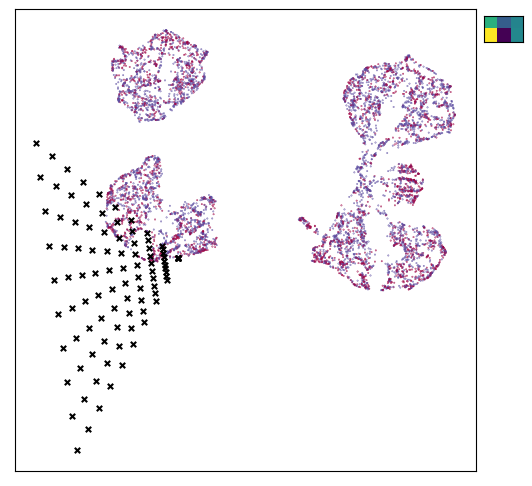

In [96]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(12,6))
gs = GridSpec(10, 20, fig)
scatter_ax = fig.add_subplot(gs[:, :10])
digit_axes = np.zeros((1, 1), dtype=object)
for i in range(1):
    for j in range(1):
        digit_axes[i, j] = fig.add_subplot(gs[i, 10 + j])

# Use umap.plot to plot to the major axis
# umap.plot.points(mapper, labels=labels, ax=scatter_ax)
scatter_ax.scatter(mapper.embedding_[:, 0], mapper.embedding_[:, 1],
                   c=tr_to_cluster.smoking, cmap='Spectral', s=0.1)
scatter_ax.set(xticks=[], yticks=[])

# Plot the locations of the text points
scatter_ax.scatter(test_pts[:, 0], test_pts[:, 1], marker='x', c='k', s=15)

# Plot each of the generated digit images
for i in range(1):
    for j in range(1):
        digit_axes[i, j].imshow(inv_transformed_points[i*10 + j].reshape(2, 3))
        digit_axes[i, j].set(xticks=[], yticks=[])

Получили какую-то спектрагамму, она очень позо  